# CONVOLUTIONAL NEURAL NETWORKS

- Convolutional Neural Networks (CNNs) are a particular type of neural network architecture that is particularly well suited for working with images or computer vision tasks.
- What are some use cases / examples of computer vision we confront daily:
     - Face recognition unlock feature in mobile phones
     - Automated driving/self-driving cars
     - Image segmentation / classification
     - In medicine e.g. Cancer detection
     - Optical character recognition


## Warm-up
- An image is a collection of pixels.
- Each pixel has value that ranges between 0 (black) and 255 (white)
- For color image
    - each pixel is composed of 3 values
    - Each value range between 0 and 255
    - The 3 values combine to give the illusion of color
 - We can play around with the pixel values to manipulate how the image looks like
 
- A good place to do this is on this [website](https://setosa.io/ev/image-kernels/)

## How Convolution Neural Networks work
- In CNNs, the network is divided into 2 sections:
1. **The feature learning (convolution) section:** 
    - This is the section that tends to reduce the dimensionality of the input features by extracting learned feature maps which are representative of the original input features. 
    - Why is reduction of dimensionality important?
        - Think of a CNN that trains on billions of high resolution images. 
        - Connecting all features between layers can be computationally expensive and somehow impossible to do. It is therefore logical to reduce the dimensionality before connecting all layers together.
2. **The classification section:** This is the section that takes the convolution output flattens them, creates fully connected layers and a classification output.

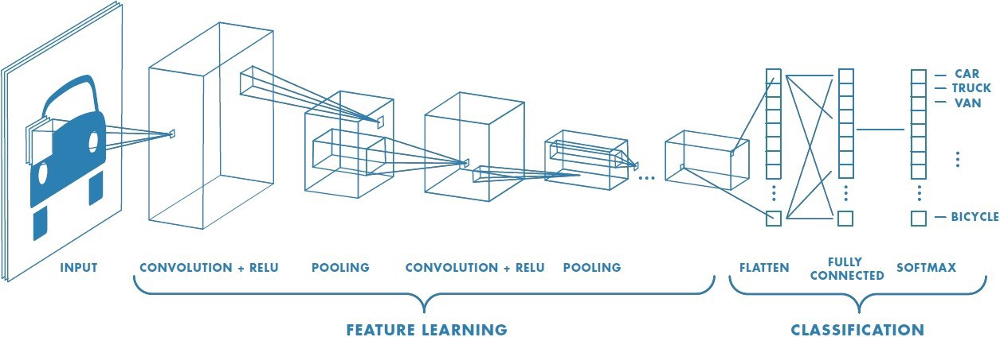

### Convolution
The concept of convolution is explained using various phrases:
#### 1. Kernel (or in some special cases, the filter)
- Take a look at the matrix below. Can you spot the eyes, the nose and smile?

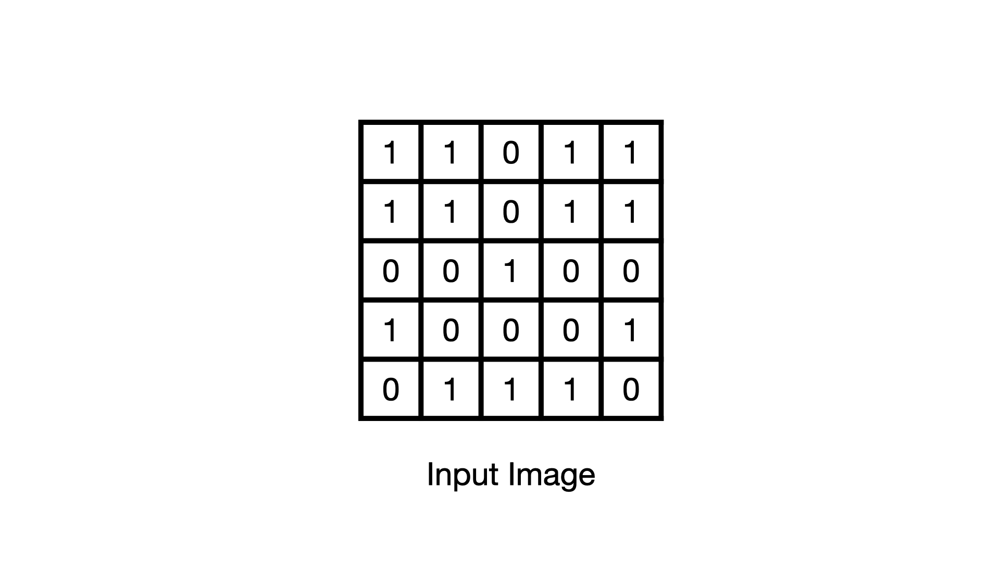

- A **Kernel** is a matrix of **weights** that we use to scan the image as we perform a dot product with sections of the image. Kernel is learned during the feature learning phase


- Take for example a 3 x 3 image below as our **Kernel**

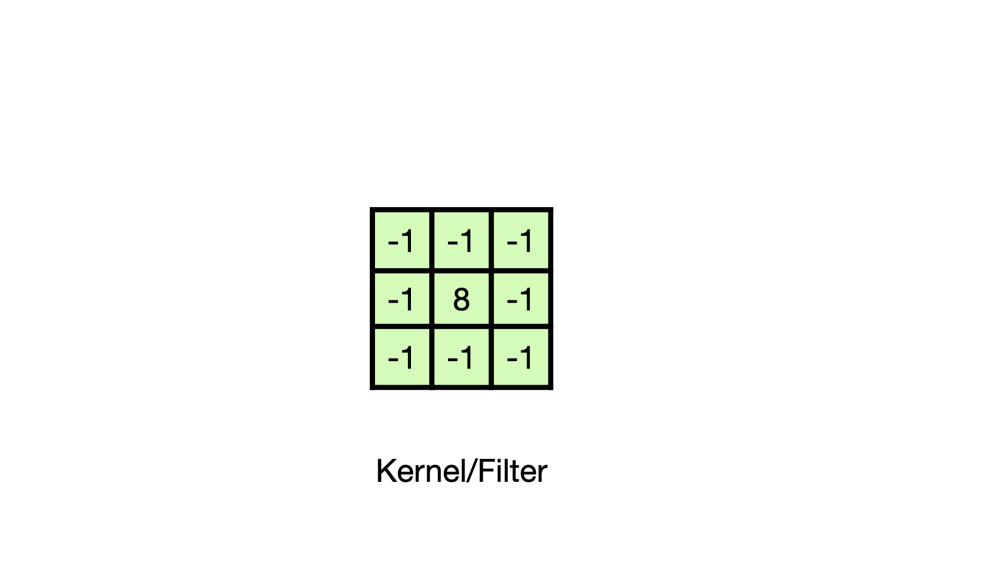


- We perform convolution by sliding the 3 x 3 Kernel (or filter in this case) over the 5 x 5 image.

- In each position, we multiply the overlapping pixels and take the sum for that pixel position (dot product)

- Move the filter to the right and repeat the above step

- Once we are done with the first row, we proceed to the second row and so on until we have an 3 x 3 feature map (output)

- The diagram below explains the concept

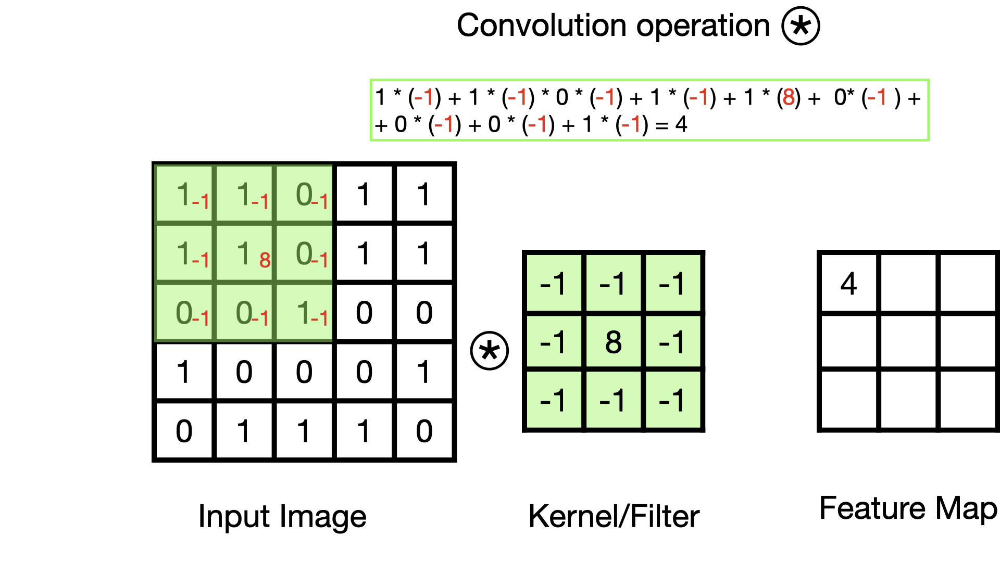

- Try to fill out the feature map on the right by sliding the kernel over the image as discussed above (or as shown below)

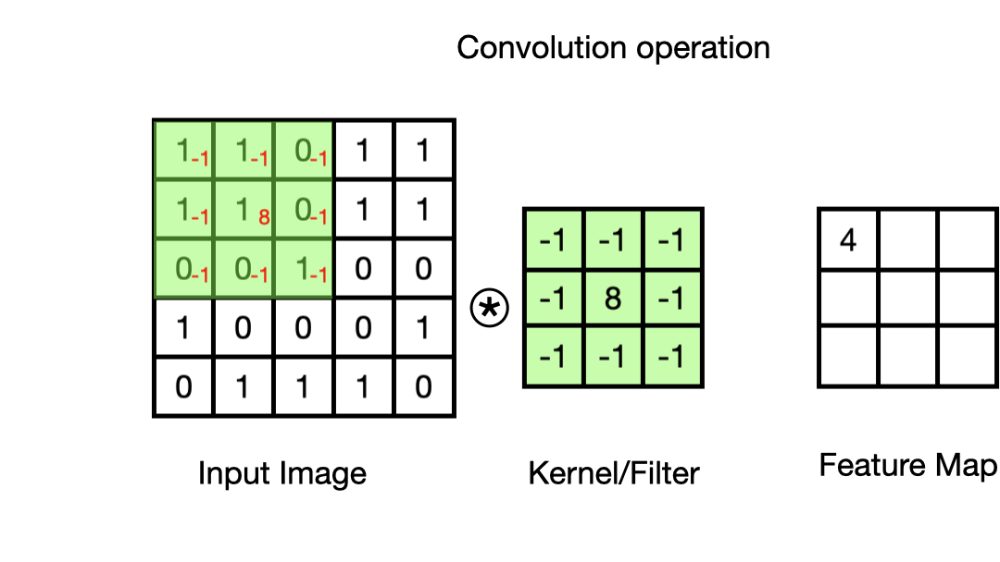

**You should have a feature map that looks like below**

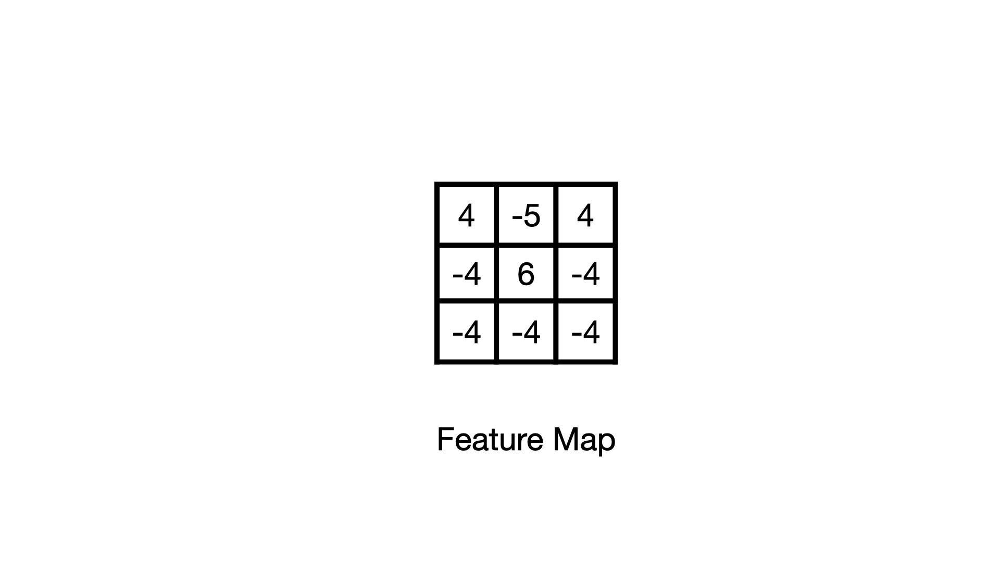

- Check out further animations from [here](https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1)

#### Summary of convolution discussed so far
- Use a Kernel (small matrix of weights) and slide over a 2D image

- Perform elementwise multiplication with the overlapping part

- Sum up the results into a single output pixel

**Note**: The convolved image has a smaller dimensionality


**Size of the resulting image after convolution**

- If the size of the original image is `nxn` and the size of the kernel is `fxf`, the size of the resulting image is `n-f+1`

In general, this is how convolution works except that the kernels/filters are learned. They are actually the weights that minimize the loss

#### 2. Stride
- Stride value controls how the kernel moves around and covers the image

- Sometimes you want to skip around the image and avoid a pixel by pixel convolution

- Below is an example of a `stride = 2` animation


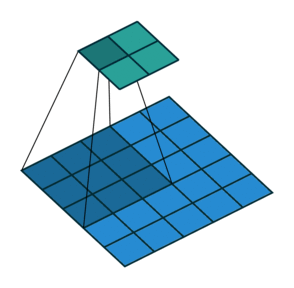

#### 3. Padding
Notice that in the above cases, the edges of the pixels are touched only once resulting in a smaller image

Padding allows us to populate the edges of the image with additional pixels so that once we convolve, the resulting image has the same dimensions as the original image


In `keras` we can specify `padding`as either of:

- `valid`: no padding
- `same`: preserve the image size by padding with zeros evenly to the left/right, top/bottom. This is so when `stride = 1`


See the diagram below for a padded image

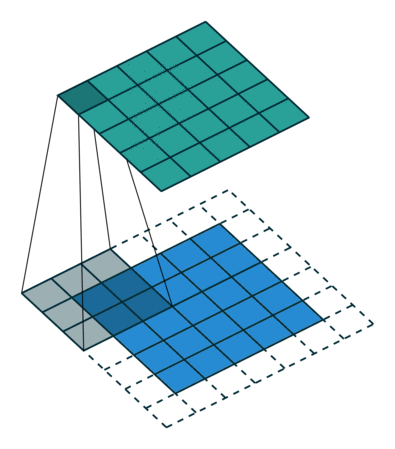

#### Size of the resulting image with padding
If the original image size is `nxn`, the kernel size being `fxf` having used `p` pixels of padding on each side, the resulting image size is given by the formula:


`n-f+1+2p`

In [2]:
n = 5
f = 3
p = 0
n-f+1+2*p

3

#### Size of the resulting image with both padding and stride
If we have a stride `s`, the resulting image described above has a size given by the formula:


`(n-f+2p)/s + 1`

In [5]:
n = 5
f = 3
p = 2
s = 1
(n-f+2*p)/s + 1

7.0

#### 4. Pooling
The pooling layer comes immediately after convolution and activation.

Pooling accumulates/pools together the features created in convolutional layers.

The most common Pooling strategy is the **Max Pooling** method. It selects only the highest value in a given pooling window


We also have **Average Pooling** that takes the average of a pooling window.


The diagram below shows how **Max Pooling works**

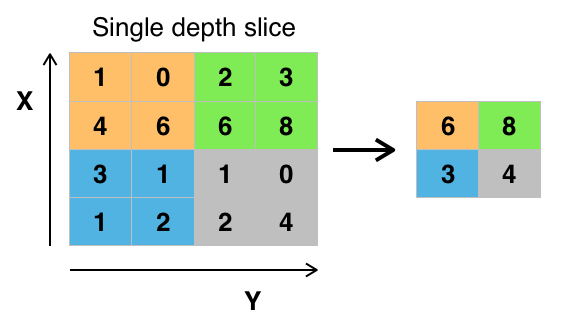

### Convolution for a color (RGB) image
In this case, we start with three kernels (which form a single filter) corresponding to each color channel.

We then perform convolution like before for each kernel and sum up the three channels to form the resulting image.

The resulting image is now 4x4x1. See the diagram below.

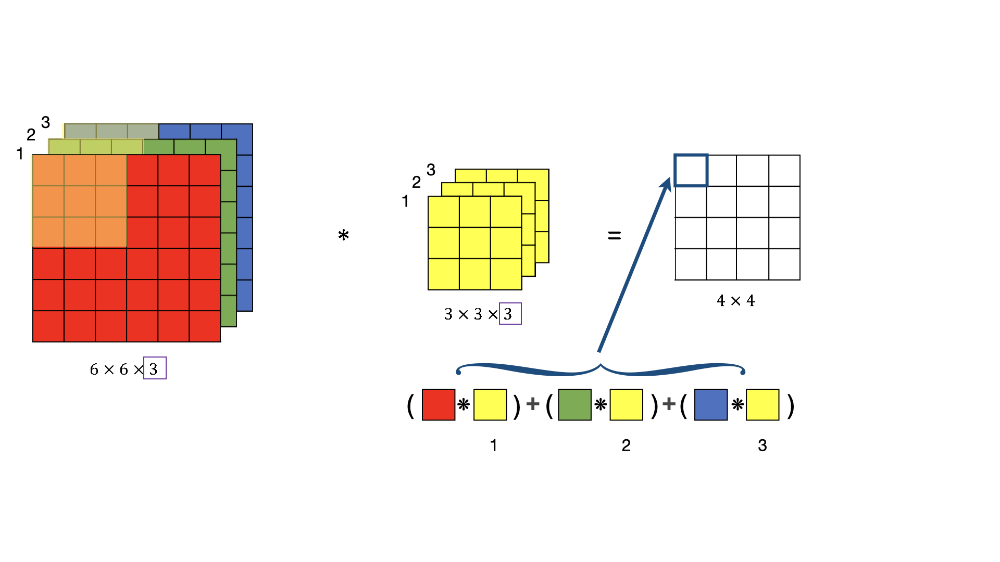

In CNNs, we generally use more than one filter (each filter having 3 kernels) in each layer. 

In such a case, the third dimension is equal to the number of filters used. 

In the above case, we only used one filter. Thus, the resulting image has a dimension of 4x4x1

Assuming that we have two filters. One filter is meant for extracting horizontal features while the second one is for vertical features.

Our resulting image would therefore have a dimension 4x4x2 with 2 representing the two filters used.

See the diagram below for 2 filters. 


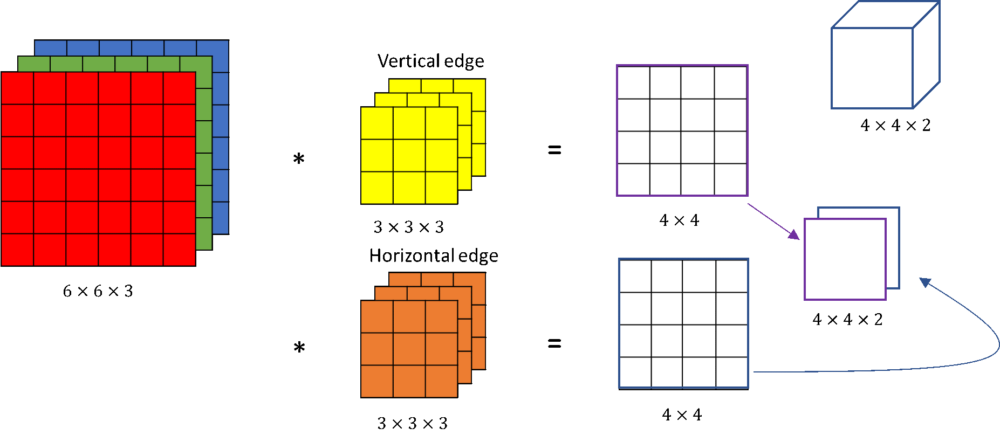


In diagrams of CNNs, this is usually represented in this way:

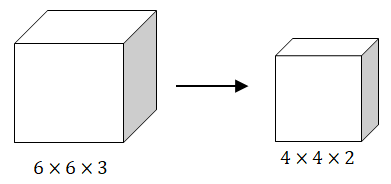

#### How do we calculate the number of parameters to learn?
If each kernel is `fxf` and the number of filters is `n_filters` the number of parameters to learn `n_weights` is given by the formula:

`n_weights = f*f*n_channels * n_filters + nbias`

`nbias` corresponds to the number of filters used.

For the above case:

`n_weights = 3 * 3 * 3 * 2 + 2 = 56`

### Example of a practical CNN architecture
- A typical architecture of CNNs has a couple of convolutional layers, followed by *fully connected layer*, i.e. feed forward NN.

- Usually, the feature learning section is an alternation of convolution and pooling layers before feeding into the fully connected layer section as shown below

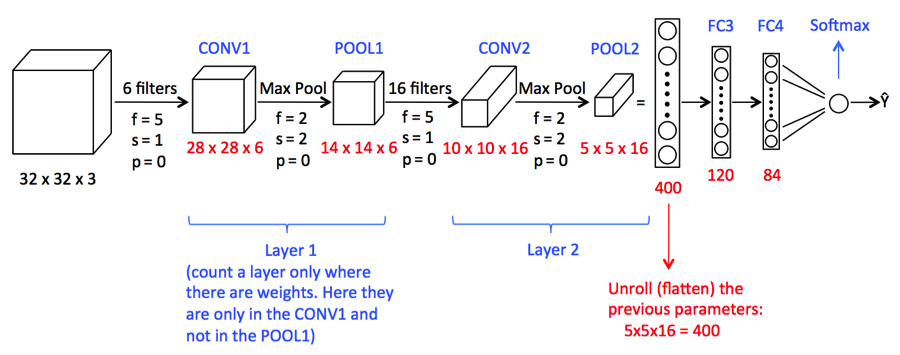


In [6]:
### calculations
# first conv1
n = 32
f = 5
p = 0
s = 1
(n-f+2*p)/s + 1

28.0

In [8]:
# pool 1
n = 28
f = 2
s = 2
p = 0
(n-f+2*p)/s + 1

14.0

In [9]:
# conv 2
n = 14
f = 5
s = 1
p = 0
(n-f+2*p)/s + 1

10.0

In [10]:
# pool 2
n = 10
f = 2
s = 2
p = 0
(n-f+2*p)/s + 1

5.0

In [11]:
# features before
32 * 32 * 3

3072

In [12]:
# features afterwards
5 * 5 * 16

400

### Use of filters
- Lowers the number of parameters
- Makes sense because a filter used for detecting a particular feature could be useful in multiple areas of an image

### How do we reduce Overfitting in our CNN?
- **Batch Normalization**
    - It is a method of making artificial neural networks faster and more stable through normalization of the layers inputs by re-centering and re-scaling

- **Dropout**:
    - Dropout is a regularization technique for reducing overfitting in artificial neural networks by preventing complex co-adaptations on training data (learning different ways of doing things to avoid memorizing one way and becoming rigid). This is done by swichting off some neurons at random during training.

## CNN with Keras

### 1. Business goal:
The task is to create an CNN that can predict a hand-written digit between 0 and 9 from the MNIST dataset - which is a collection of about 70,000 images of hand-written digits.

#### Ignore Keras warnings (not recommended)

In [13]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

#### Import `tensorflow.keras` modules

In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import models, layers

#### Import the `mnist` data

In [15]:
from tensorflow.keras.datasets import mnist

#### Import module that one-hot-encodes labels

In [14]:
from tensorflow.keras.utils import to_categorical

#### How does one-hot-encoding work?
in `keras` the `to_categorical` works as follows:

In [20]:
to_categorical([0, 3, 5, 8, 5])

array([[1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0.]], dtype=float32)

#### And finally, we need `numpy`

In [21]:
import numpy as np

### 2. Get (Load) the Data

In [22]:
(Xtrain, ytrain), (Xtest, ytest) = mnist.load_data()

### 3. Preprocessing
#### 3.1 Check the shapes

In [23]:
Xtrain.shape, ytrain.shape, Xtest.shape, ytest.shape

((60000, 28, 28), (60000,), (10000, 28, 28), (10000,))

#### 3.2 Reshape images
- We need each image to have a 3D to reflect an RGB
- For simplicity, we want to only use black and white and therefore the last dimension is going to be 1 and not 3
- We therefore want each image to be of the shape 28 x 28 x 1

In [25]:
Xtrain = Xtrain.reshape(60000, 28, 28, 1)
Xtest = Xtest.reshape(10000, 28, 28, 1)

#### 3.3 Re-check the shapes

In [26]:
Xtrain.shape, Xtest.shape

((60000, 28, 28, 1), (10000, 28, 28, 1))

#### 3.4 Copy the true test labels to a new variable
- We need to use them at the end before we OHC the labels for comparison with the predicted labels

In [27]:
ytest_true = ytest.copy()

#### 3.5 Catch a glimpse of a single image

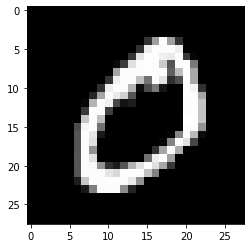

In [34]:
import matplotlib.pyplot as plt
plt.imshow(Xtrain[1], cmap="gray");

In [31]:
ytrain[43987]

4

In [32]:
ytrain

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

#### 3.6 One-Hot-Encode the labels

In [35]:
ytrain = to_categorical(ytrain)
ytest = to_categorical(ytest)

In [38]:
ytrain[0]

array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.], dtype=float32)

#### 3.7 Check shape of one image to feed into  CNN

In [40]:
Xtrain[31789].shape

(28, 28, 1)

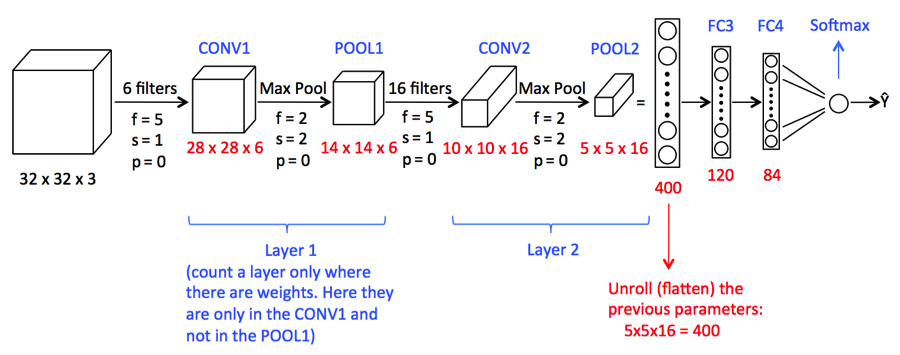

### 4. Define the model

1. Convolutional layer with 6 transformations
- Max Pooling
- ReLu Activation

2. Convolutional layers with 16 transformations
- Max Pooling
- ReLu Activation

3. Flatten

4. Dense layer with 120 neurons

5. Dense layer with 84 neurons

6. Dense layer with 10 neurons for classification

7. Softmax activation for classification


#### Clear session 

In [41]:
from tensorflow.keras import backend as K
K.clear_session()

#### 4.1 Create the architecture

In [44]:
model = Sequential([
    
    # first convolutional and max pooling layer
    Conv2D(filters=6,
          kernel_size=(3,3),
          strides=(1,1),
          padding="same",
          activation="relu",
          input_shape=(28, 28, 1)),
    MaxPooling2D(pool_size=(2,2),
                strides=(2,2),
                padding="same"),
    #BatchNormalization(), # optional
    
    # Second convolutional and max pooling layer
    Conv2D(filters=16,
          kernel_size=(3,3),
          strides=(1,1),
          padding="same",
          activation="relu"),
    MaxPooling2D(pool_size=(2,2),
                strides=(2,2),
                padding="same"),
    
    # Flatten
    Flatten(),
    
    # Fully connected
    # layer 1
    Dense(120, activation="relu"),
    #Dropout(0.2), # optional
    
    # layer 2
    Dense(84, activation="relu"),
    #Dropout(0.2), # optional
    
    # Output layer
    Dense(10, activation="softmax")
])

#### 4.2 Check the model summary

In [45]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 6)         60        
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 16)        880       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 16)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 120)               9

### 5. Compile the model
- **Optimizer:** Adam optimizer. Load it from keras
- **Loss:** categorical_crossentropy
- **Metrics:** accuracy

In [46]:
from tensorflow.keras.optimizers import Adam

In [47]:
model.compile(optimizer=Adam(), 
              loss="categorical_crossentropy", 
              metrics=["accuracy"])

### 6. Fit the model
- epochs = 10
- batch size = 32

In [48]:
fit_history = model.fit(Xtrain, ytrain, batch_size=32, epochs=10, validation_split=0.2)

Epoch 1/10
1500/1500 [==============================] - 31s 20ms/step - loss: 0.4670 - accuracy: 0.9176 - val_loss: 0.1198 - val_accuracy: 0.9631
Epoch 2/10
1500/1500 [==============================] - 36s 24ms/step - loss: 0.0985 - accuracy: 0.9697 - val_loss: 0.0939 - val_accuracy: 0.9729
Epoch 3/10
1500/1500 [==============================] - 36s 24ms/step - loss: 0.0704 - accuracy: 0.9784 - val_loss: 0.0878 - val_accuracy: 0.9750
Epoch 4/10
1500/1500 [==============================] - 36s 24ms/step - loss: 0.0565 - accuracy: 0.9819 - val_loss: 0.0995 - val_accuracy: 0.9682
Epoch 5/10
1500/1500 [==============================] - 36s 24ms/step - loss: 0.0469 - accuracy: 0.9850 - val_loss: 0.1016 - val_accuracy: 0.9728
Epoch 6/10
1500/1500 [==============================] - 23s 15ms/step - loss: 0.0396 - accuracy: 0.9871 - val_loss: 0.0837 - val_accuracy: 0.9778
Epoch 7/10
1500/1500 [==============================] - 35s 24ms/step - loss: 0.0346 - accuracy: 0.9887 - val_loss: 0.0825 -

### 7. Evaluate model
- Plot the accuracy and loss

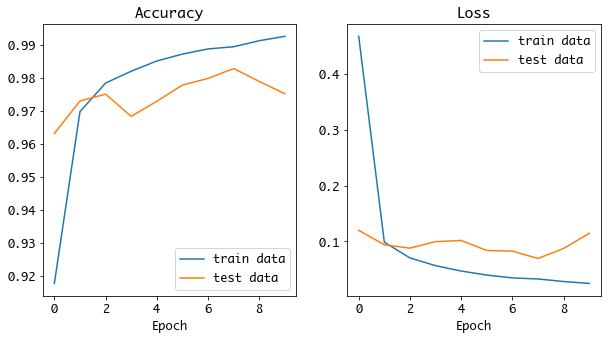

In [49]:
plt.rcParams["figure.figsize"] = (10, 5)
plt.rcParams["font.family"] = "monaco"
plt.rcParams["font.size"] = 12
plt.rcParams["font.weight"] = "bold"
plt.subplot(1, 2, 1)
plt.plot(fit_history.history["accuracy"], label="train data")
plt.plot(fit_history.history["val_accuracy"], label="test data")
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.legend();
plt.subplot(1, 2, 2)
plt.plot(fit_history.history["loss"], label="train data")
plt.plot(fit_history.history["val_loss"], label="test data")
plt.title("Loss")
plt.xlabel("Epoch")
plt.legend();

### 8. Prediction

In [50]:
ypred = model.predict(Xtest)

313/313 [==============================] - 2s 5ms/step


In [52]:
ytest_true[0]

7

In [54]:
np.argmax(ypred[0])

7

In [56]:
ypred.shape

(10000, 10)

#### 8.1 Take the highest probability from ypred


In [57]:
y_pred_labels = np.argmax(ypred, axis=1)

In [58]:
y_pred_labels

array([7, 2, 1, ..., 4, 5, 6])

#### 8.2 Create a confusion matrix

In [59]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [60]:
plt.rcParams["figure.figsize"] = (8, 8)

In [61]:
cm = confusion_matrix(y_true=ytest_true, y_pred=y_pred_labels)

In [62]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(ytest_true))

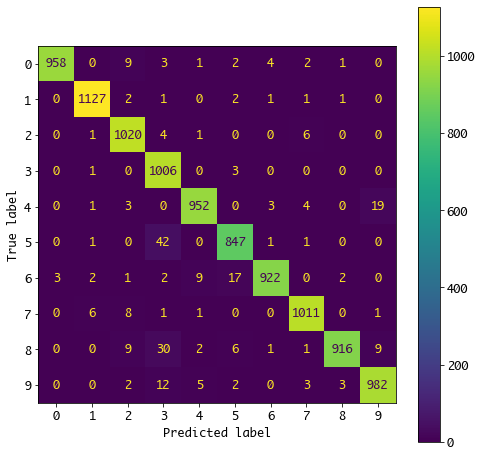

In [63]:
disp.plot();

In [64]:
ytest.shape

(10000, 10)